In [1]:
import pandas as pd
import os

In [2]:
os.listdir("demand_data")

['archive1dayahead.csv',
 'archive2dayahead.csv',
 'demanddata.csv',
 'demanddata2024.csv',
 'demanddataupdate.csv',
 'demanddata_2020.csv',
 'demanddata_2021.csv',
 'demanddata_2022.csv',
 'ng-demand-1da.csv',
 'ng-demand-2da.csv']

# Get historical demand data from https://www.neso.energy/ and preprocess it (https://www.neso.energy/data-portal/historic-demand-data/historic_demand_data_2022#) #

In [3]:
import numpy as np


def extract_historic_demand_data(file_path:str = "demand_data"):
    df = None
    for file in os.listdir(file_path):
        if "demanddata" in file:
            if df is None:
                df = pd.read_csv(f"{file_path}/{file}")
                df = df[['SETTLEMENT_DATE', 'SETTLEMENT_PERIOD', 'ND', 'TSD',
            'ENGLAND_WALES_DEMAND', 'EMBEDDED_WIND_GENERATION',
            'EMBEDDED_WIND_CAPACITY', 'EMBEDDED_SOLAR_GENERATION',
            'EMBEDDED_SOLAR_CAPACITY']]
                
                df = df.replace({"SETTLEMENT_DATE": {"JAN": "01", "FEB": "02", "MAR":"03", "APR":"04", "MAY":"05", "JUN":"06", "JUL":"07", "AUG":"08", "SEP":"09", "OCT":"10", "NOV":"11", "DEC":"12"}}, regex = True)
                df["SETTLEMENT_DATE"] = pd.to_datetime(df["SETTLEMENT_DATE"]).dt.strftime('%d-%m-%Y')

            else:
                df_next = pd.read_csv(f"{file_path}/{file}")
                df_next = df_next[['SETTLEMENT_DATE', 'SETTLEMENT_PERIOD', 'ND', 'TSD',
            'ENGLAND_WALES_DEMAND', 'EMBEDDED_WIND_GENERATION',
            'EMBEDDED_WIND_CAPACITY', 'EMBEDDED_SOLAR_GENERATION',
            'EMBEDDED_SOLAR_CAPACITY']]
                df_next = df_next.replace({"SETTLEMENT_DATE": {"JAN": "01", "FEB": "02", "MAR":"03", "APR":"04", "MAY":"05", "JUN":"06", "JUL":"07", "AUG":"08", "SEP":"09", "OCT":"10", "NOV":"11", "DEC":"12",}}, regex = True)
                df_next['SETTLEMENT_DATE'] = df_next['SETTLEMENT_DATE'].apply(lambda x: '-'.join([f'{int(part):02d}' for part in x.split('-')]))
                try:
                    df_next["SETTLEMENT_DATE"] = pd.to_datetime(df_next["SETTLEMENT_DATE"]).dt.strftime('%d-%m-%Y')
                except Exception as e:
                    pass

                df = pd.concat([df, df_next])

    # datetime conversion
    df["SETTLEMENT_DATE"] = pd.to_datetime(df["SETTLEMENT_DATE"], format =  "%d-%m-%Y")
    df = df.sort_values(["SETTLEMENT_DATE", "SETTLEMENT_PERIOD"])
    # format date to datetime
    df["SETTLEMENT_DATE"] = df["SETTLEMENT_DATE"] + pd.to_timedelta(0.5*(df["SETTLEMENT_PERIOD"] - 1), "h")
    df = df.drop(["SETTLEMENT_PERIOD"], axis = 1)
    # remove empty demand forecasts (we can get them through the Rebase API)
    df[df["ND"] + df["TSD"] + df["ENGLAND_WALES_DEMAND"] > 0]
    # some demand values drop randomly to 0. Replace them with the previous value
    df.loc[df["ENGLAND_WALES_DEMAND"] == 0, "ENGLAND_WALES_DEMAND"] = np.nan
    df = df.bfill()
    df = df.dropna(axis = 0)
    # convert MW to MWh
    df[[ 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
        'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
        'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY']] = 0.5 * df[[ 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
        'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
        'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY']]
    
    return df
    
df = extract_historic_demand_data()

In [4]:
df.head()

,SETTLEMENT_DATE,ND,TSD,ENGLAND_WALES_DEMAND,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,EMBEDDED_SOLAR_CAPACITY
0,2020-01-01 00:00:00,13170.0,13576.5,11910.5,622.0,3232.5,0.0,6540.0
1,2020-01-01 00:30:00,13460.5,13842.0,12196.5,594.0,3232.5,0.0,6540.0
2,2020-01-01 01:00:00,13284.5,13620.0,12042.5,578.0,3232.5,0.0,6540.0
3,2020-01-01 01:30:00,12877.0,13217.5,11675.0,562.5,3232.5,0.0,6540.0
4,2020-01-01 02:00:00,12537.5,12912.0,11394.0,553.0,3232.5,0.0,6540.0


In [5]:
import plotly.express as px

px.line(df, x = "SETTLEMENT_DATE", y = ["ENGLAND_WALES_DEMAND", "EMBEDDED_SOLAR_GENERATION", "EMBEDDED_WIND_GENERATION"])

# Get energy data #

In [6]:
import pandas as pd
import os
from Preprocessing import *
preprocesser = Preprocessing()
extractor = FileExtractor()
df_energy = extractor.combine_files("csv_files", "Energy_data", ".csv")
df_energy = preprocesser.preprocess_energy_data(df_energy, trading = True)[["dtm", "SS_Price", "DA_Price"]]
df_energy

,dtm,SS_Price,DA_Price
0,2020-09-20 00:00:00+00:00,2.50000,32.17
0,2020-09-20 00:00:00+00:00,2.50000,32.17
1,2020-09-20 00:30:00+00:00,15.00000,32.17
1,2020-09-20 00:30:00+00:00,15.00000,32.17
2,2020-09-20 01:00:00+00:00,47.95000,32.00
...,...,...,...
5851,2024-05-19 21:30:00+00:00,56.20000,76.81
5852,2024-05-19 22:00:00+00:00,102.00023,71.11
5853,2024-05-19 22:30:00+00:00,99.00000,71.11
5854,2024-05-19 23:00:00+00:00,106.44988,66.51


# Merge energy data with historic demand data #

In [7]:
def merge_demand_and_energy_data(demand_data, energy_data):
    demand_data["SETTLEMENT_DATE"] = demand_data["SETTLEMENT_DATE"].dt.tz_localize("UTC")
    demand_and_energy = demand_data.merge(energy_data, left_on = "SETTLEMENT_DATE", right_on = "dtm")
    # we can't get those features from deployment, so they will be removed
    demand_and_energy = demand_and_energy.drop(["EMBEDDED_WIND_GENERATION", "EMBEDDED_SOLAR_GENERATION", "ENGLAND_WALES_DEMAND", "EMBEDDED_WIND_CAPACITY", "EMBEDDED_SOLAR_CAPACITY"], axis = 1)
    return demand_and_energy

demand_and_energy = merge_demand_and_energy_data(df, df_energy)
demand_and_energy.head()

,SETTLEMENT_DATE,ND,TSD,dtm,SS_Price,DA_Price
0,2020-09-20 00:00:00+00:00,10030.0,10462.0,2020-09-20 00:00:00+00:00,2.50,32.17
1,2020-09-20 00:00:00+00:00,10030.0,10462.0,2020-09-20 00:00:00+00:00,2.50,32.17
2,2020-09-20 00:30:00+00:00,9694.5,10239.0,2020-09-20 00:30:00+00:00,15.00,32.17
3,2020-09-20 00:30:00+00:00,9694.5,10239.0,2020-09-20 00:30:00+00:00,15.00,32.17
4,2020-09-20 01:00:00+00:00,9468.0,9904.0,2020-09-20 01:00:00+00:00,47.95,32.00


In [8]:
def get_historic_demand_weather_data(geo_data_dict:dict = {"dwd_icon_eu_demand":"nc_files", "ncep_gfs_demand":"nc_files"},
                                     energy_data_dict:dict = {"Energy_data":"csv_files"}, 
                                     file_name:str = "preprocessed_demand_with_energy.parquet"):
    # get the weather data
    try:
        weather = pd.read_parquet(f"{file_name}")
    except:
        weather = preprocesser.perform_preprocessing_pipeline(geo_data_dict = geo_data_dict,
            deployment = False, merge_with_outage_data = False, energy_data_dict = energy_data_dict,
                                                #non_numerical_columns = ["unavailabilityType", "affectedUnit"],
                                                fft = False)
        weather.to_parquet("preprocessed_demand_with_energy.parquet")
        
    return weather


def combine_historic_demand_data(weather_data, demand_energy_data):
    demand_with_weather = weather_data.merge(demand_energy_data, left_on = "dtm", right_on = "SETTLEMENT_DATE")
    demand_with_weather["dayofweek_sin"] = demand_with_weather["dtm"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
    demand_with_weather["dayofweek_cos"] = demand_with_weather["dtm"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
    demand_with_weather.set_index("dtm", inplace = True)
    demand_with_weather.drop(["SETTLEMENT_DATE", "Solar_MWh_credit", "Wind_MWh_credit"], axis = 1, inplace = True)
    demand_with_weather = demand_with_weather.reindex(sorted(demand_with_weather.columns), axis=1)
    return demand_with_weather

## Perform everything above in one cell (for training) ##

In [9]:
import pandas as pd
import os
from Preprocessing import *
preprocesser = Preprocessing()
extractor = FileExtractor()
demand_data = extract_historic_demand_data()
energy_data = extractor.combine_files("csv_files", "Energy_data", ".csv")
energy_data = preprocesser.preprocess_energy_data(energy_data, trading = True)[["dtm", "SS_Price", "DA_Price"]]
demand_energy = merge_demand_and_energy_data(demand_data, energy_data)
weather_data = get_historic_demand_weather_data(geo_data_dict = {"dwd_icon_eu_demand":"nc_files", "ncep_gfs_demand":"nc_files"},
                                     energy_data_dict = {"Energy_data":"csv_files"}, 
                                     file_name = "preprocessed_demand_with_energy.parquet")
historic_demand_with_weather = combine_historic_demand_data(weather_data = weather_data, demand_energy_data = demand_energy)

In [10]:
historic_demand_with_weather.columns

Index(['DA_Price', 'ND', 'SS_Price', 'TSD', 'cos_day', 'cos_hour', 'cos_month',
       'dayofweek_cos', 'dayofweek_sin', 'sin_day', 'sin_hour', 'sin_month',
       'temp', 'temp_diff', 'temp_max_1h', 'temp_max_3h', 'temp_max_6h',
       'temp_mean_1h', 'temp_mean_3h', 'temp_mean_6h', 'temp_min_1h',
       'temp_min_3h', 'temp_min_6h', 'temp_next_forecast', 'temp_range_3h',
       'temp_std_1h', 'temp_std_3h', 'temp_std_6h', 'total_prec',
       'total_prec_max_1h', 'total_prec_max_3h', 'total_prec_max_6h',
       'total_prec_mean_1h', 'total_prec_mean_3h', 'total_prec_mean_6h',
       'total_prec_min_1h', 'total_prec_min_3h', 'total_prec_min_6h',
       'total_prec_next_forecast', 'total_prec_std_1h', 'total_prec_std_3h',
       'total_prec_std_6h', 'wind_dir_cos', 'wind_dir_sin', 'wind_speed',
       'wind_speed_diff', 'wind_speed_max_1h', 'wind_speed_max_3h',
       'wind_speed_max_6h', 'wind_speed_mean_1h', 'wind_speed_mean_3h',
       'wind_speed_mean_6h', 'wind_speed_min_1h', 'win

In [11]:
fe = FeatureEngineerer(label = ["DA_Price", "SS_Price"])
fe.perform_feature_engineering(historic_demand_with_weather, labels_to_remove =  ["DA_Price", "SS_Price"])

# Get current demand forecasts for deployment #

In [12]:
# Forecast für day-ahead-demand
# national_demand: NDF berücksichtigt die Übertragungsverluste, aber nicht die Transformatorenlast, die Pumpspeichernachfrage oder die Interkonnektornachfrage; die Daten werden nur auf nationaler Ebene gemeldet
# transmition_system_demand: TSDF berücksichtigt die Übertragungsverluste, die Transformatorenlast, die Pumpspeichernachfrage und die Interkonnektornachfrage. Die Daten werden sowohl auf nationaler Ebene als auch auf der Ebene der Grenzgebiete (Systemzonen) gemeldet
# boundary: geografischer Bezugsbereich (https://www.arcgis.com/apps/webappviewer/index.html?id=cb3474a78df24139b1651908ff8c8975)
# keine historischen Daten verfügbar
import comp_utils

def preprocess_api_demand_forecast(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    da_demand_forecast = comp_utils.RebaseAPI.get_day_ahead_demand_forecast(rebase_api_client) # Gibt Liste zurück
    da_demand_forecast = pd.DataFrame(da_demand_forecast)
    # drop redundant columns
    da_demand_forecast = da_demand_forecast.drop(["publish_time_utc", "settlement_date", "settlement_period"], axis = 1)
    # convert to datetime
    da_demand_forecast["timestamp_utc"] = pd.to_datetime(da_demand_forecast["timestamp_utc"])
    # convert MW to MWh
    da_demand_forecast[["transmission_system_demand", "national_demand"]] = 0.5 * da_demand_forecast[["transmission_system_demand", "national_demand"]]
    # include capacities from historical data (last known values)
    #da_demand_forecast[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]] = df[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]].iloc[-1]
    da_demand_forecast = da_demand_forecast.drop(["boundary"], axis = 1)
    da_demand_forecast = da_demand_forecast.rename(columns = {"national_demand": "ND", "timestamp_utc": "SETTLEMENT_DATE", "transmission_system_demand": "TSD"})
    da_demand_forecast.sort_values(["SETTLEMENT_DATE"])
    return da_demand_forecast

da_demand_forecast = preprocess_api_demand_forecast()
da_demand_forecast.head()

<Response [200]>


,SETTLEMENT_DATE,TSD,ND
0,2024-10-22 11:00:00+00:00,15340.0,14600.0
1,2024-10-22 11:30:00+00:00,15030.5,14290.5
2,2024-10-22 12:00:00+00:00,14773.0,14033.0
3,2024-10-22 12:30:00+00:00,14490.0,13750.0
4,2024-10-22 13:00:00+00:00,14539.0,13799.0


In [13]:
import plotly.express as px
px.line(da_demand_forecast, x = "SETTLEMENT_DATE", y = ["TSD", "ND"], title = "API Forecast of TSD and ND")

# Get the API weather data #

In [14]:
import comp_utils
rebase_api_client = comp_utils.RebaseAPI(api_key = open("DanMaLeo_key.txt").read())
dwd_demand = rebase_api_client.get_demand_nwp(model = "DWD_ICON-EU")
ncep_gfs_demand = rebase_api_client.get_demand_nwp(model = "NCEP_GFS")

200
200


In [15]:
from Preprocessing import *
preprocesser = Preprocessing()
preprocessed_demand = preprocesser.perform_preprocessing_pipeline(geo_data_dict={"dwd":dwd_demand, "ncep":ncep_gfs_demand}, deployment = True, merge_with_outage_data = False)
preprocessed_demand.reset_index(inplace = True)
preprocessed_demand["dayofweek_sin"] = preprocessed_demand["val_time"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
preprocessed_demand["dayofweek_cos"] = preprocessed_demand["val_time"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
preprocessed_demand.set_index("val_time", inplace = True)

INFO:root:Perform data cleaning on the weather data...
INFO:root:Merge weather stations...
INFO:root:Preprocessing done!


In [16]:
merged_demand_and_weather = preprocessed_demand.merge(da_demand_forecast, left_index = True, right_on = "SETTLEMENT_DATE").drop(["SETTLEMENT_DATE"], axis = 1)
merged_demand_and_weather = merged_demand_and_weather.reindex(sorted(merged_demand_and_weather.columns), axis=1)

## Perform everything from above in one cell (for deployment) ##

In [17]:
import comp_utils

def get_deployment_demand_weather_data(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    # get the weather data from the API
    dwd_demand = rebase_api_client.get_demand_nwp(model = "DWD_ICON-EU")
    ncep_gfs_demand = rebase_api_client.get_demand_nwp(model = "NCEP_GFS")
    # preprocess the gathered weather data
    preprocesser = Preprocessing()
    preprocessed_demand_weather = preprocesser.perform_preprocessing_pipeline(geo_data_dict={"dwd":dwd_demand, "ncep":ncep_gfs_demand}, deployment = True, merge_with_outage_data = False)
    preprocessed_demand_weather.reset_index(inplace = True)
    preprocessed_demand_weather["dayofweek_sin"] = preprocessed_demand_weather["val_time"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
    preprocessed_demand_weather["dayofweek_cos"] = preprocessed_demand_weather["val_time"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
    preprocessed_demand_weather.set_index("val_time", inplace = True)
    return preprocessed_demand_weather

def preprocess_api_demand_forecast(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    da_demand_forecast = comp_utils.RebaseAPI.get_day_ahead_demand_forecast(rebase_api_client) # Gibt Liste zurück
    da_demand_forecast = pd.DataFrame(da_demand_forecast)
    # drop redundant columns
    da_demand_forecast = da_demand_forecast.drop(["publish_time_utc", "settlement_date", "settlement_period"], axis = 1)
    # convert to datetime
    da_demand_forecast["timestamp_utc"] = pd.to_datetime(da_demand_forecast["timestamp_utc"])
    # convert MW to MWh
    da_demand_forecast[["transmission_system_demand", "national_demand"]] = 0.5 * da_demand_forecast[["transmission_system_demand", "national_demand"]]
    # include capacities from historical data (last known values)
    #da_demand_forecast[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]] = df[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]].iloc[-1]
    da_demand_forecast = da_demand_forecast.drop(["boundary"], axis = 1)
    da_demand_forecast = da_demand_forecast.rename(columns = {"national_demand": "ND", "timestamp_utc": "SETTLEMENT_DATE", "transmission_system_demand": "TSD"})
    da_demand_forecast.sort_values(["SETTLEMENT_DATE"])
    return da_demand_forecast

def combine_deployment_demand_data(da_demand_forecast, demand_weather):
    merged_demand_data = demand_weather.merge(da_demand_forecast, left_index = True, right_on = "SETTLEMENT_DATE").drop(["SETTLEMENT_DATE"], axis = 1)
    merged_demand_data = merged_demand_data.reindex(sorted(merged_demand_data.columns), axis=1)
    return merged_demand_data

demand_weather = get_deployment_demand_weather_data()
da_demand_forecast = preprocess_api_demand_forecast()
deployed_demand_with_weather = combine_deployment_demand_data(da_demand_forecast = da_demand_forecast, demand_weather = demand_weather)

200


INFO:root:Perform data cleaning on the weather data...


200


INFO:root:Merge weather stations...
INFO:root:Preprocessing done!


<Response [200]>


In [58]:
import comp_utils
rebase_api_client = comp_utils.RebaseAPI(api_key = open("DanMaLeo_key.txt").read())


SyntaxError: f-string: expecting '}' (897675026.py, line 2)

In [18]:
fe.perform_feature_engineering(deployed_demand_with_weather, deployment = True)

In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
lr = LinearRegression()
rfr = RandomForestRegressor(n_estimators = 50, max_depth = 10, min_samples_split = 50, min_samples_leaf = 20)
gbr1 = GradientBoostingRegressor(n_estimators = 50, max_depth = 10, min_samples_split = 50, min_samples_leaf = 20)
gbr2 = GradientBoostingRegressor(n_estimators = 50, max_depth = 10, min_samples_split = 50, min_samples_leaf = 20)
lr.fit(fe.X_train, fe.y_train)
rfr.fit(fe.X_train, fe.y_train)

RandomForestRegressor(max_depth=10, min_samples_leaf=20, min_samples_split=50,
                      n_estimators=50)

In [41]:
gbr1.fit(fe.X_train, fe.y_train["DA_Price"])
gbr2.fit(fe.X_train, fe.y_train["SS_Price"])

GradientBoostingRegressor(max_depth=10, min_samples_leaf=20,
                          min_samples_split=50, n_estimators=50)

In [46]:
backup = {"train": fe.y_train.copy(), "val": fe.y_val.copy(), "test": fe.y_test.copy()}

In [47]:
import model_utils

quantiles = np.arange(0.1, 1.0, 0.1)
quantiles = np.round(quantiles, 1)

# Specify model save directory
model_save_dir_qr = "lgbm_model_demand_DA_Price"

fe.y_train = fe.y_train["DA_Price"]
fe.y_val = fe.y_val["DA_Price"]
fe.y_test = fe.y_test["DA_Price"]


lgbm_model = model_utils.LGBMRegressorModel(fe, quantiles, model_save_dir=model_save_dir_qr, load_pretrained=False)
lgbm_model.train_and_predict()  # This will skip training for already loaded models
print(f"Quantile Regressor Pinball Score: {lgbm_model.pinball_score()}")

[LightGBM] [Info] Total Bins 13164
[LightGBM] [Info] Number of data points in the train set: 79971, number of used features: 58
[LightGBM] [Info] Start training from score 46.439999
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 8.88769	valid's quantile: 5.04531
[100]	train's quantile: 8.35377	valid's quantile: 5.10906
Early stopping, best iteration is:
[57]	train's quantile: 8.76881	valid's quantile: 5.03116
Saved Quantile Regressor model for quantile 0.1 to lgbm_model_demand_DA_Price\lgbm_model_quantile_0.1.pkl
[LightGBM] [Info] Total Bins 13164
[LightGBM] [Info] Number of data points in the train set: 79971, number of used features: 58
[LightGBM] [Info] Start training from score 58.730000
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 15.5388	valid's quantile: 8.5354
Early stopping, best iteration is:
[38]	train's quantile: 16.17	valid's quantile: 8.51168
Saved Quantile Regressor model for quantile 0.2 to lgbm

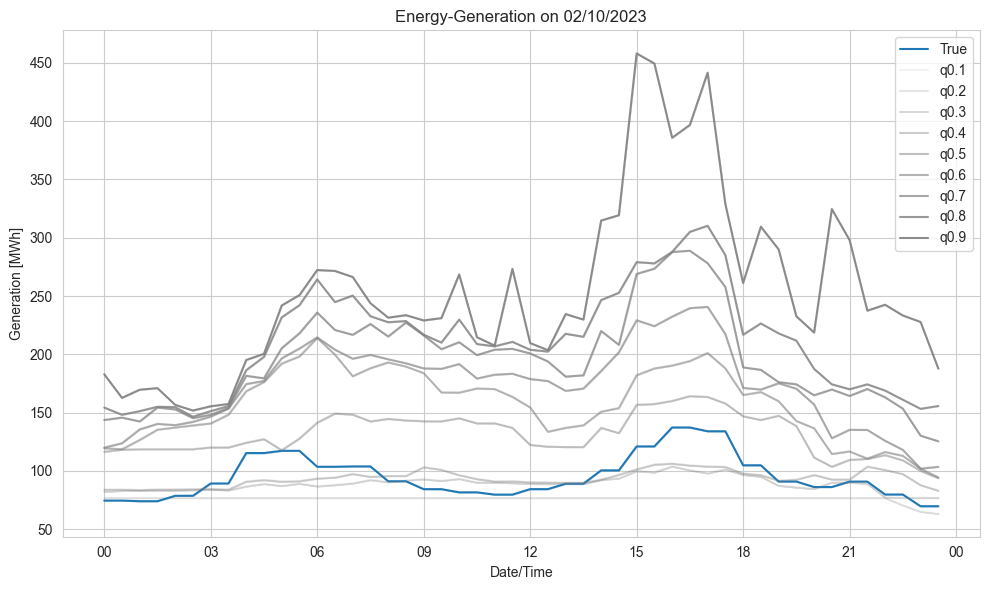

In [50]:
lgbm_model.plot_quantils(fe.y_test.index, lgbm_model.q_predictions, quantiles, month=10, day = 2)

In [52]:
# Specify model save directory
model_save_dir_qr = "lgbm_model_demand_SS_Price"

fe.y_train = backup["train"]["SS_Price"].copy()
fe.y_val = backup["val"]["SS_Price"].copy()
fe.y_test = backup["test"]["SS_Price"].copy()


lgbm_model = model_utils.LGBMRegressorModel(fe, quantiles, model_save_dir=model_save_dir_qr, load_pretrained=False)
lgbm_model.train_and_predict()  # This will skip training for already loaded models
print(f"Quantile Regressor Pinball Score: {lgbm_model.pinball_score()}")

[LightGBM] [Info] Total Bins 13164
[LightGBM] [Info] Number of data points in the train set: 79971, number of used features: 58
[LightGBM] [Info] Start training from score 28.549999
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 11.364	valid's quantile: 8.72586
[100]	train's quantile: 10.7377	valid's quantile: 8.72576
Early stopping, best iteration is:
[65]	train's quantile: 11.1632	valid's quantile: 8.70439
Saved Quantile Regressor model for quantile 0.1 to lgbm_model_demand_SS_Price\lgbm_model_quantile_0.1.pkl
[LightGBM] [Info] Total Bins 13164
[LightGBM] [Info] Number of data points in the train set: 79971, number of used features: 58
[LightGBM] [Info] Start training from score 51.500000
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 18.9672	valid's quantile: 14.3342
Early stopping, best iteration is:
[33]	train's quantile: 19.7699	valid's quantile: 14.2432
Saved Quantile Regressor model for quantile 0.2 to lg

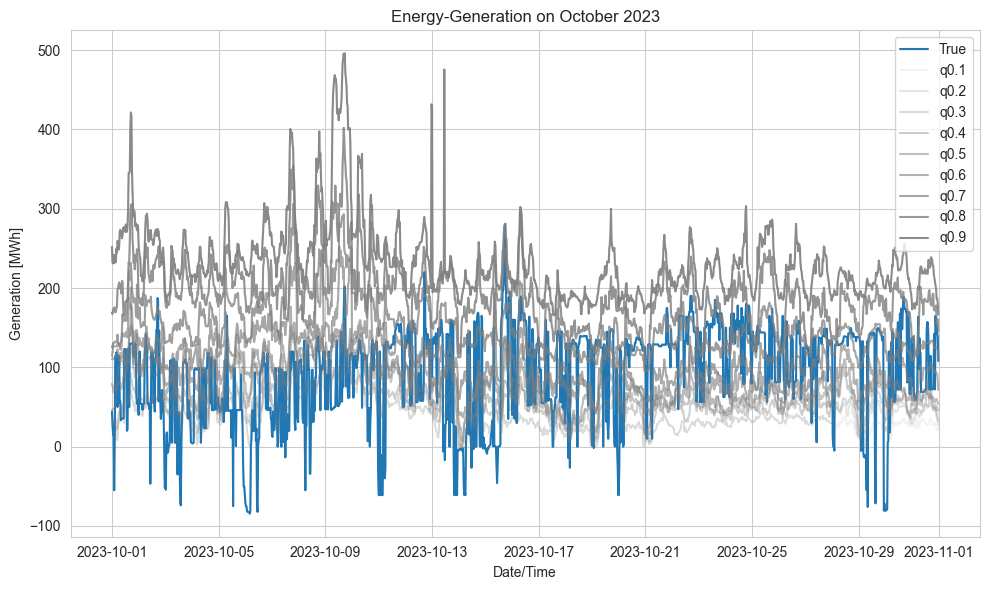

In [54]:
lgbm_model.plot_quantils(fe.y_test.index, lgbm_model.q_predictions, quantiles, month=10)

In [ ]:
lgbm_model.plot_quantils(fe.y_test.index, lgbm_model.q_predictions, quantiles, month=10, day = 2)

In [42]:
from sklearn.metrics import r2_score, mean_absolute_error as mae, mean_absolute_percentage_error as mape
pred_lr = lr.predict(fe.X_test)
pred_rfr = rfr.predict(fe.X_test)
pred_gbr1 = gbr1.predict(fe.X_test)
pred_gbr2 = gbr2.predict(fe.X_test)
print(r2_score(fe.y_test, pred_lr))
print(r2_score(fe.y_test, pred_rfr))
print(r2_score(fe.y_test["DA_Price"], pred_gbr1))
print(r2_score(fe.y_test["SS_Price"], pred_gbr2))

-3.530080073922071
-7.880401394132662
-12.141758165085808
-7.041739585266935


In [33]:
print(mae(fe.y_test, pred_lr))
print(mae(fe.y_test, pred_rfr))
print(mae(fe.y_test["DA_Price"], pred_gbr1))
print(mae(fe.y_test["SS_Price"], pred_gbr2))

67.26125237925231
89.36127162294136
77.6029552188523
84.04507506065376


In [35]:
print(mape(fe.y_test, pred_lr))
print(mape(fe.y_test, pred_rfr))
print(mape(fe.y_test["DA_Price"], pred_gbr1))
print(mape(fe.y_test["SS_Price"], pred_gbr2))

3037209718488666.5
3154452619250791.0
255215045590831.16
7240695342303517.0


In [38]:
import plotly.express as px

px.line(x = fe.y_test.index, y = [fe.y_test["DA_Price"], pred_lr[:, 0], pred_rfr[:, 0], pred_gbr1], labels = ["True", "LR", "RFR", "GBR"], title = "Predicted DA_Price (red) vs. actual values (blue)")

In [32]:
import plotly.express as px

px.line(x = fe.y_test.index, y = [fe.y_test["SS_Price"], pred[:, 1]], title = "Predicted SS_Price (red) vs. actual values (blue)")